In [ ]:
!git clone https://github.com/avanetten/yoltv5

Cloning into 'yoltv5'...
remote: Enumerating objects: 229, done.
remote: Counting objects: 100% (229/229), done.
remote: Compressing objects: 100% (147/147), done.
remote: Total 229 (delta 88), reused 214 (delta 77), pack-reused 0
Receiving objects: 100% (229/229), 1.90 MiB | 2.84 MiB/s, done.
Resolving deltas: 100% (88/88), done.


In [ ]:
!pip install -r /content/yoltv5/yoltv5/yolov5/requirements.txt

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 12.1 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import json
import cv2
import os

In [ ]:
def parse_shape(shape):
    data, start, end = [], [], []
    
    for index, s in enumerate(shape):
        if s=='{':
            start.append(index)
        if s=='}':
            end.append(index+1)
    
    for s, e in zip(start, end):
        data.append(json.loads(shape[s:e]))
    return data


def write_txt(data, save_path):
    with open(save_path, 'w') as f:
        for line in data:
            f.write(f"{line}\n")

def shape2yolo(shape, img_path, save_path):
    data = parse_shape(shape)
    h, w, _ = cv2.imread(img_path).shape
    peoples = []
    
    for i in data:
        x_c, y_c, w_2 = i['cx'], i['cy'], i['r']
        w_2 = w_2*2/w
        x_c /= w
        y_c /= h
        peoples.append(f"0 {x_c} {y_c} {w_2} {w_2}")
    
    write_txt(peoples, save_path)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
train_dataset_df = pd.read_csv('/content/drive/MyDrive/OTUS-CV-final-project/anno_train2.csv', delimiter=' ')

In [ ]:
# Скачаем и распакуем данные
! unzip /content/drive/MyDrive/OTUS-CV-final-project/peoples.zip > /dev/null

In [ ]:
src_img_dir = "/content/train/"
!mkdir -p /content/train/labels
!mkdir -p /content/train/images
!mv /content/peoples/images_train/* /content/train/images/
base_img_dir = "/content/train/images/"

In [ ]:
for index, row in train_dataset_df.iterrows():
  shape = row['boxes']
  shape2yolo(shape, os.path.join(base_img_dir, row['name']), os.path.join(src_img_dir, 'labels', row['name'].split('.')[0]+'.txt'))

In [ ]:
test_dataset_df = pd.read_csv('/content/drive/MyDrive/OTUS-CV-final-project/anno_test2.csv', delimiter=' ')

In [ ]:
src_img_dir = "/content/test/"
!mkdir -p /content/test/labels
!mkdir -p /content/test/images
!mv /content/peoples/images_test/* /content/test/images/
base_img_dir = "/content/test/images/"

In [ ]:
for index, row in test_dataset_df.iterrows():
  shape = row['boxes']
  shape2yolo(shape, os.path.join(base_img_dir, row['name']), os.path.join(src_img_dir, 'labels', row['name'].split('.')[0]+'.txt'))

In [ ]:
!python /content/yoltv5/yoltv5/yolov5/train.py --img 1280 --batch -1 --epochs 100 --data "/content/drive/MyDrive/OTUS-CV-final-project/peoples.yaml" --weights yolov5l.pt

train: weights=yolov5l.pt, cfg=, data=/content/drive/MyDrive/OTUS-CV-final-project/peoples.yaml, hyp=yoltv5/yoltv5/yolov5/data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=-1, imgsz=1280, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=yoltv5/yoltv5/yolov5/runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: skipping check (not a git repository), for updates see https://github.com/ultralytics/yolov5
YOLOv5 🚀 2023-2-2 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.

In [ ]:
!python /content/yoltv5/yoltv5/yolov5/detect.py --source "/content/test/images/" --weights "/content/yoltv5/yoltv5/yolov5/runs/train/exp/weights/best.pt" --save-txt --save-conf --name "yoltv5_people_test" --imgsz 1280 --exist-ok --conf-thres 0.2

detect: weights=['/content/yoltv5/yoltv5/yolov5/runs/train/exp/weights/best.pt'], source=/content/test/images/, data=yoltv5/yoltv5/yolov5/data/coco128.yaml, imgsz=[1280, 1280], conf_thres=0.2, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=yoltv5/yoltv5/yolov5/runs/detect, name=yoltv5_people_test, exist_ok=True, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 2023-2-2 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)

Fusing layers... 
Model summary: 367 layers, 46108278 parameters, 0 gradients, 107.6 GFLOPs
image 1/3 /content/test/images/6906.JPG: 736x1280 3 mans, Done. (0.059s)
image 2/3 /content/test/images/8406.jpg: 736x1280 4 mans, Done. (0.059s)
image 3/3 /content/test/images/8507.JPG: 736x1280 3 mans, Done. (0.059s)
Speed: 1.0ms pre-process, 59.0ms inference, 2.0ms NMS per ima

In [ ]:
from PIL import Image, ImageDraw
import random
import numpy as np
from matplotlib.pyplot import figure
import matplotlib.pyplot as plt

IsADirectoryError: ignored

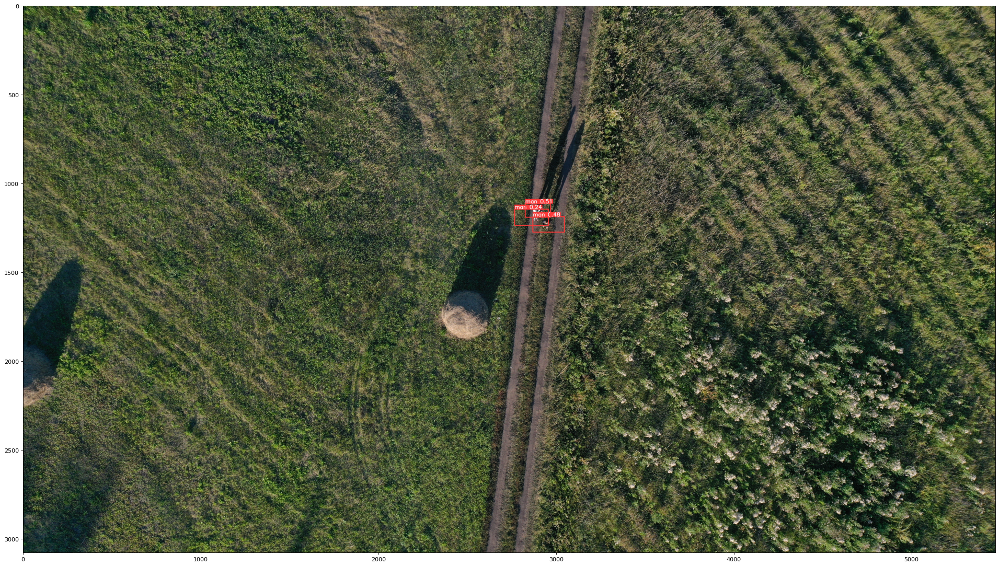

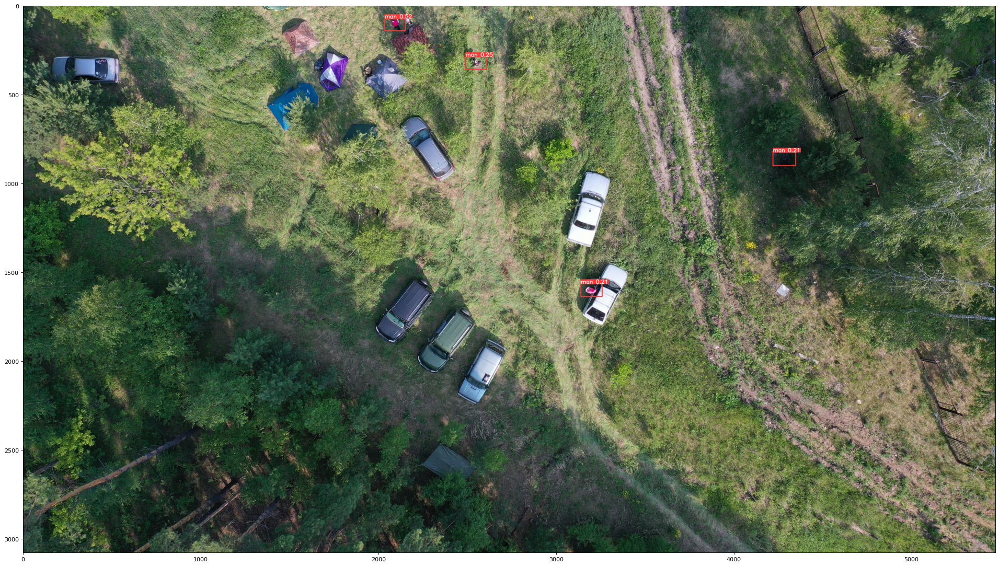

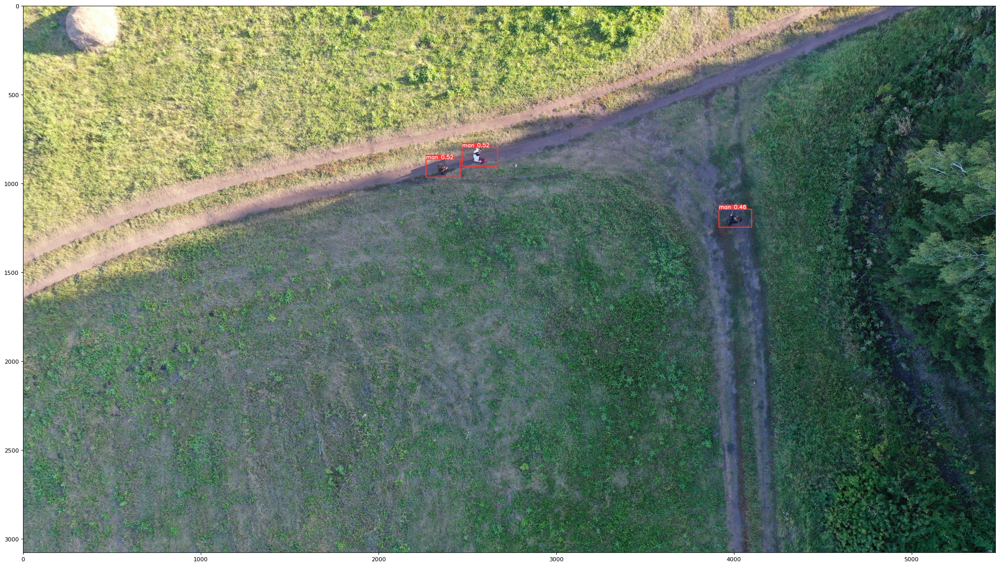

In [ ]:
detections_dir = "/content/yoltv5/yoltv5/yolov5/runs/detect/yoltv5_people_test"
detection_images = [os.path.join(detections_dir, x) for x in os.listdir(detections_dir)]

for image in detection_images:
  img = Image.open(image)
  figure(num=None,figsize=(30,30),dpi=80)
  plt.imshow(np.array(img))